In [26]:
# Hvor meget strøm er der blevet brugt af alle nodes
# Hvor meget strøm der er genereret af PV
# Hvor strøm der er hentet fra grid


# Kommer batterier nogensinde til 100% - Svar: JA
# Exporter vi nogensinde strøm til grid - Svar: NEJ

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator, FormatStrFormatter
import seaborn as sns
import os

PATH_PLUGIN = '../results/plugin/25may-5xspeed-withplugin/logs/'
PATH_DEFAULT_SCHEDULER = '../results/default-scheduler/26may-5xspeed-withoutplugin/logs/'

battery_cols = ['battery', 'battery.1', 'battery.2', 'battery.3', 'battery.4']
node_cols = ['node', 'node.1', 'node.2', 'node.3', 'node.4', 'node.5', 'node.6', 'node.7', 'node.8', 'node.9', 'node.10', 'node.11', 'node.12', 'node.13', 'node.14', 'node.15', 'node.16', 'node.17']
pv_cols = ['pv_source', 'pv_source.1', 'pv_source.2', 'pv_source.3']
grid_cols = ['grid', 'grid.1', 'grid.2', 'grid.3', 'grid.4', 'grid.5', 'grid.6', 'grid.7']


## Generate a dict for each microgrid

In [28]:
gridnames = pd.read_csv('../data/gridnames.csv')
names = gridnames['Gridname'].to_list()

dataframes_plugin = {}
dataframes_default_scheduler = {}


for name in names:
    file_path = os.path.join(PATH_PLUGIN, f"{name}.csv")
    if os.path.exists(file_path):
        dataframes_plugin[name] = pd.read_csv(file_path)
    else:
        print(f"Warning: File {file_path} does not exist.")

for name in names:
    file_path = os.path.join(PATH_DEFAULT_SCHEDULER, f"{name}.csv")
    if os.path.exists(file_path):
        dataframes_default_scheduler[name] = pd.read_csv(file_path)
    else:
        print(f"Warning: File {file_path} does not exist.")




## Battery Dataframes

In [29]:
battery_dataframes_plugin = {}
battery_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_scheduler[name] = df[existing_cols]


### Rename headers

In [30]:
for key, df in battery_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_plugin[key] = df

for key, df in battery_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_scheduler[key] = df


battery_dataframes_plugin['AL00']


1,charge_amount,current_charge,discharge_amount,reward,soc
0,0.0,11648.350000,720.0,-0.0,0.500000
1,0.0,10848.350000,718.0,-0.0,0.465660
2,0.0,10050.572222,720.0,-0.0,0.431416
3,0.0,9250.572222,720.0,-0.0,0.397077
4,0.0,8450.572222,720.0,-0.0,0.362737
...,...,...,...,...,...
303,0.0,0.000000,0.0,-0.0,0.000000
304,0.0,0.000000,0.0,-0.0,0.000000
305,0.0,0.000000,0.0,-0.0,0.000000
306,0.0,0.000000,0.0,-0.0,0.000000


### Plot figures (SOC)

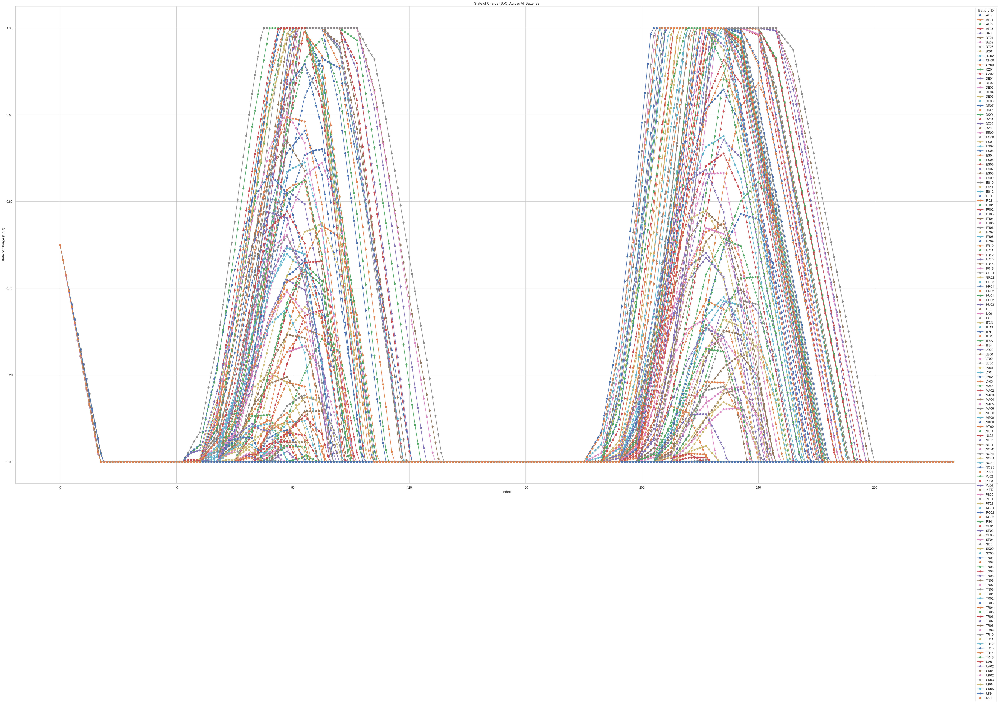

In [31]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in battery_dataframes_plugin.items():
    if 'soc' not in df.columns:
        print(f"Skipping {key}: no 'soc' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['soc'] = pd.to_numeric(df['soc'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['soc'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("State of Charge (SoC) Across All Batteries")
plt.xlabel("Index")
plt.ylabel("State of Charge (SoC)")
plt.grid(True)
plt.legend(title="Battery ID")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Grid Dataframes

In [32]:
grid_dataframes_plugin = {}
grid_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_scheduler[name] = df[existing_cols]

### Rename headers

In [33]:
for key, df in grid_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_plugin[key] = df

for key, df in grid_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_scheduler[key] = df


grid_dataframes_plugin['AL00']

1,co2_per_kwh_current,co2_production,export_price_current,grid_export,grid_import,grid_status_current,import_price_current,reward
0,999.0,-0.0,0.000876,0.0,-0.0,1.0,0.000973,0.000000
1,999.0,-0.0,0.000876,0.0,-0.0,1.0,0.000973,0.000000
2,999.0,-0.0,0.000876,0.0,-0.0,1.0,0.000973,0.000000
3,999.0,-0.0,0.000876,0.0,-0.0,1.0,0.000973,0.000000
4,999.0,-0.0,0.000876,0.0,-0.0,1.0,0.000973,0.000000
...,...,...,...,...,...,...,...,...
303,999.0,719280.0,0.000876,0.0,720.0,1.0,0.000973,-0.700563
304,999.0,719280.0,0.000876,0.0,720.0,1.0,0.000973,-0.700563
305,999.0,719280.0,0.000876,0.0,720.0,1.0,0.000973,-0.700563
306,999.0,719280.0,0.000876,0.0,720.0,1.0,0.000973,-0.700563


### Plot figures (Export, Import, CO2 Production)

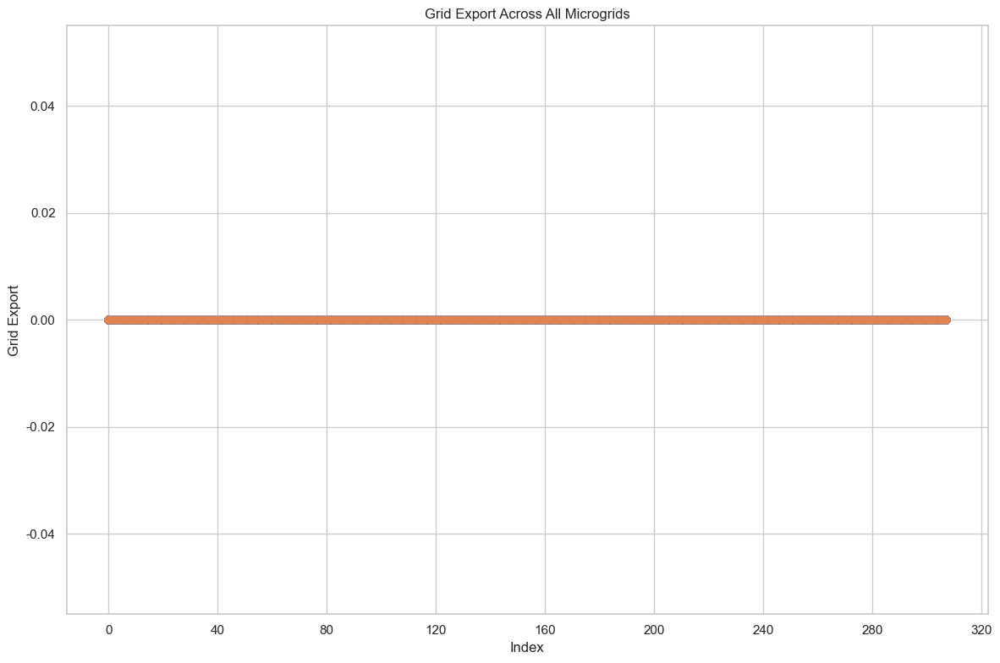

In [34]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_export'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Grid Export Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Export")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

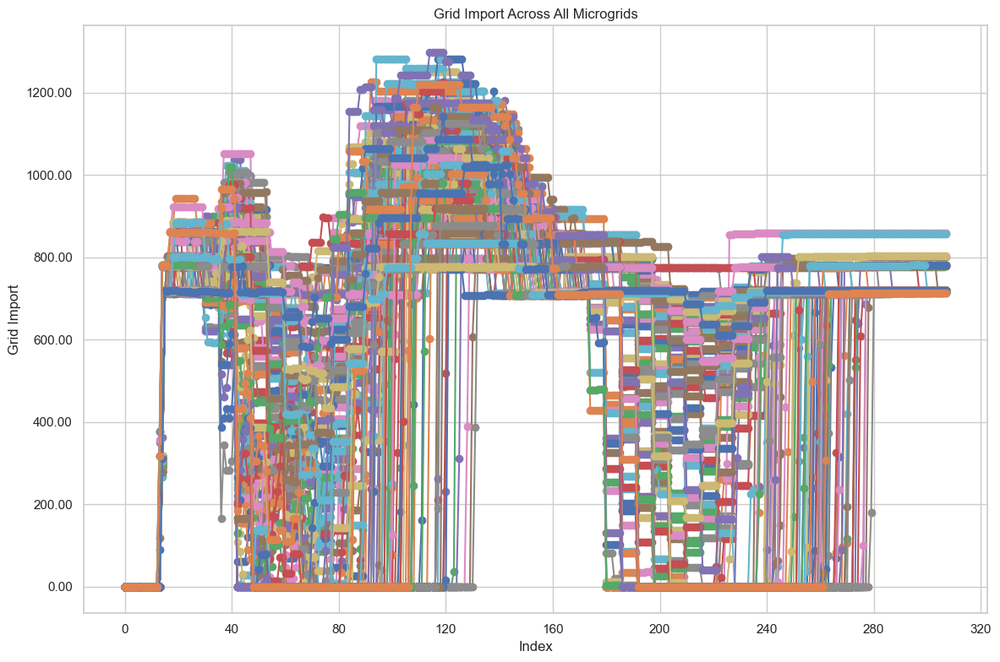

In [35]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_import' not in df.columns:
        print(f"Skipping {key}: no 'grid_import' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_import'] = pd.to_numeric(df['grid_import'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_import'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Grid Import Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Import")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## PV Dataframes

In [36]:
pv_dataframes_plugin = {}
pv_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_scheduler[name] = df[existing_cols]

In [37]:
for key, df in pv_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_plugin[key] = df

for key, df in pv_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_scheduler[key] = df


pv_dataframes_scheduler['AL00']

1,curtailment,renewable_current,renewable_used,reward
0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0
...,...,...,...,...
387,0.0,0.0,0.0,0.0
388,0.0,0.0,0.0,0.0
389,0.0,0.0,0.0,0.0
390,0.0,0.0,0.0,0.0


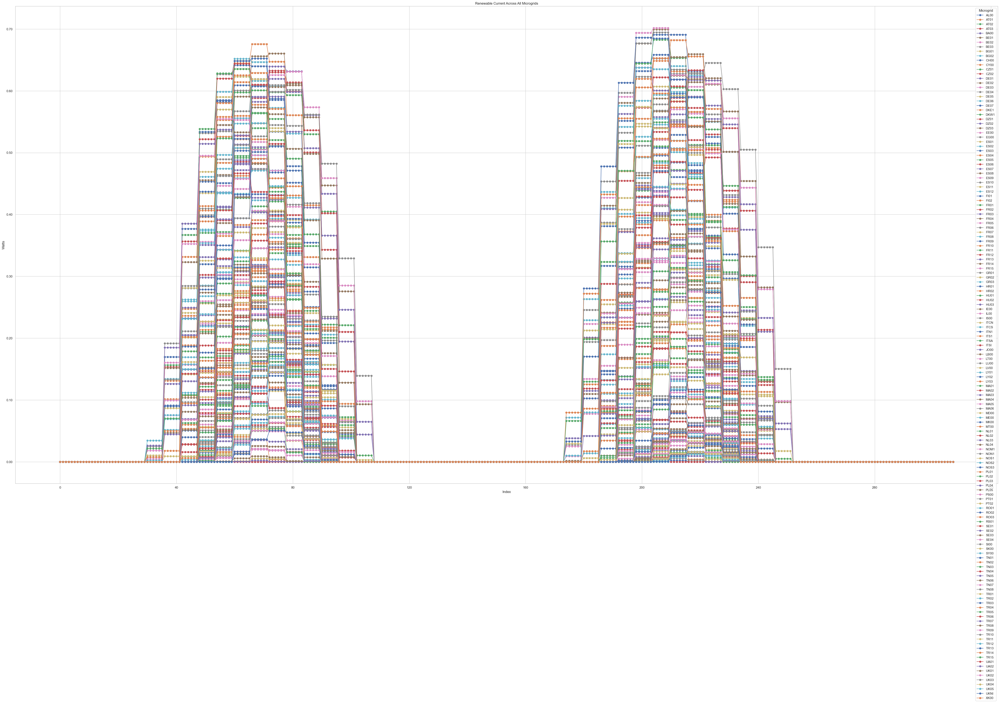

In [38]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in pv_dataframes_plugin.items():
    if 'renewable_current' not in df.columns:
        print(f"Skipping {key}: no 'renewable_current' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['renewable_current'] = pd.to_numeric(df['renewable_current'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['renewable_current'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Renewable Current Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Nodes Dataframes

In [39]:
nodes_dataframes_plugin = {}
nodes_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_scheduler[name] = df[existing_cols]

In [40]:
for key, df in nodes_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_plugin[key] = df

for key, df in nodes_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_scheduler[key] = df


nodes_dataframes_scheduler['TR10']

1,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward
0,120,-59.481963,0.0,120,-44.877580,0.0,120,-0.759295,0.0,120,-57.871521,0.0,120,-46.647117,0.0,120,-50.763622,0.0
1,120,-36.507199,0.0,120,-34.833665,0.0,120,-53.812142,0.0,120,-48.563753,0.0,120,-54.285852,0.0,120,-35.981958,0.0
2,120,-16.613206,0.0,120,-46.614458,0.0,120,-29.666297,0.0,120,-50.495262,0.0,120,-41.286534,0.0,120,-42.737372,0.0
3,120,-17.862433,0.0,120,-1.337987,0.0,120,-35.536769,0.0,120,-0.124600,0.0,120,-47.950001,0.0,120,-4.497583,0.0
4,120,-18.442951,0.0,120,-2.053270,0.0,120,-30.384277,0.0,120,-32.998274,0.0,120,-0.684689,0.0,120,-54.960032,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
387,120,-3.010589,0.0,120,-8.611803,0.0,120,-32.269773,0.0,120,-48.987008,0.0,120,-36.067063,0.0,120,-28.973140,0.0
388,120,-30.908347,0.0,120,-21.822232,0.0,120,-11.569733,0.0,120,-38.707092,0.0,120,-18.014822,0.0,120,-13.423643,0.0
389,120,-27.709871,0.0,120,-29.558115,0.0,120,-32.012628,0.0,120,-43.846764,0.0,120,-23.623604,0.0,120,-52.916817,0.0
390,120,-40.440596,0.0,120,-24.392327,0.0,120,-33.286459,0.0,120,-48.506600,0.0,120,-11.343001,0.0,120,-19.568709,0.0


In [42]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame
for key, df in nodes_dataframes_plugin.items():
    # Find all column indices where the name is 'load_met'
    load_met_indices = [i for i, col in enumerate(df.columns) if col == 'load_met']
    
    if not load_met_indices:
        print(f"Skipping {key}: no 'load_met' columns found.")
        continue

    # Plot each 'load_met' column individually
    for idx_num, col_idx in enumerate(load_met_indices, 1):
        col_data = pd.to_numeric(df.iloc[:, col_idx], errors='coerce')
        label = f"{key} - load_met {idx_num}" if len(load_met_indices) > 1 else f"{key}"
        plt.plot(df.index, col_data, marker='o', linestyle='-', label=label)

# Customize plot
plt.title("Node Load Met Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

C:\Users\Simon\AppData\Local\Temp\ipykernel_21840\4277358967.py:30: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


## Explore relation between PV Generation, Battery current_charge, grid import/export

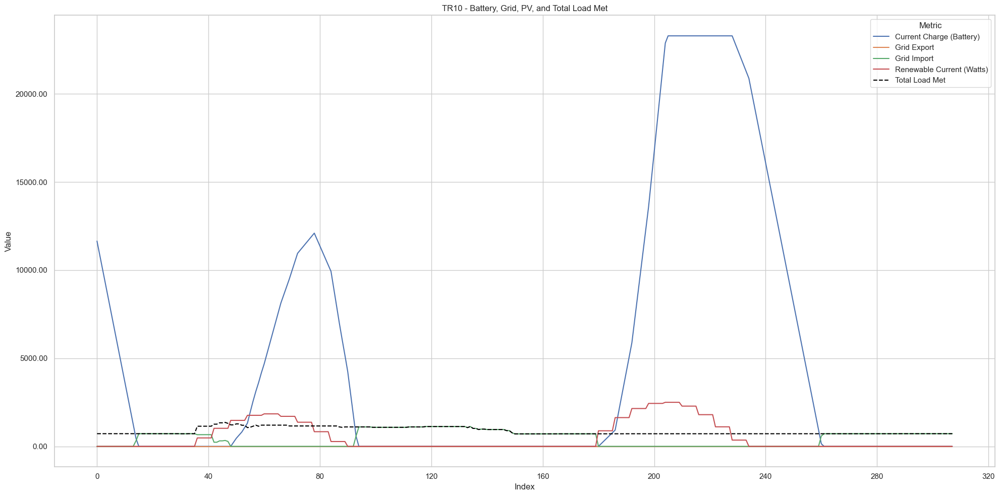

In [44]:
# Set Seaborn style
sns.set(style="whitegrid")

# Extract the relevant DataFrames
battery_df = battery_dataframes_plugin.get('TR10')
grid_df = grid_dataframes_plugin.get('TR10')
pv_df = pv_dataframes_plugin.get('TR10')
nodes_df = nodes_dataframes_plugin.get('TR10')

# Check that all exist
if battery_df is None or grid_df is None or pv_df is None or nodes_df is None:
    raise ValueError("One or more dataframes for 'TR10' are missing.")

# Convert necessary columns to numeric
battery_df['current_charge'] = pd.to_numeric(battery_df['current_charge'], errors='coerce')
grid_df['grid_export'] = pd.to_numeric(grid_df['grid_export'], errors='coerce')
grid_df['grid_import'] = pd.to_numeric(grid_df['grid_import'], errors='coerce')
pv_df['renewable_current'] = pd.to_numeric(pv_df['renewable_current'], errors='coerce')

# Scale renewable_current to watt-hours (assuming it's energy per second)
pv_df['renewable_current_watts'] = pv_df['renewable_current'] * 3600

# Sum all 'load_met' columns from nodes_df (handling duplicates)
load_met_indices = [i for i, col in enumerate(nodes_df.columns) if col == 'load_met']
if not load_met_indices:
    print("No 'load_met' columns found in nodes_df for TR10.")
    total_load_met = None
else:
    # Sum all matching columns across the rows
    load_met_df = nodes_df.iloc[:, load_met_indices].apply(pd.to_numeric, errors='coerce')
    total_load_met = load_met_df.sum(axis=1)

# Create the plot
plt.figure(figsize=(20, 10))

# Plot each series from its respective DataFrame
plt.plot(battery_df.index, battery_df['current_charge'], label='Current Charge (Battery)')
plt.plot(grid_df.index, grid_df['grid_export'], label='Grid Export')
plt.plot(grid_df.index, grid_df['grid_import'], label='Grid Import')
plt.plot(pv_df.index, pv_df['renewable_current_watts'], label='Renewable Current (Watts)')

# Plot summed load_met if available
if total_load_met is not None:
    plt.plot(nodes_df.index, total_load_met, label='Total Load Met', linestyle='--', color='black')

# Customize the plot
plt.title("TR10 - Battery, Grid, PV, and Total Load Met")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend(title="Metric")
plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()